# Transformata Fouriera

<b> ZAD 1 </b>
1. Zamień sygnał na sumę sygnałów np
```julia
x = sin.(2*pi*t*200) + 2* sin.(2*pi*t*400) 
```

  Zaobserwuj wynik transformaty i wyjaśnij go.
<p>


In [50]:
using Plots

# produkcja sztucznego sygnału.
#Wybieram częstotliwość próbkowania
Fs = 1024;  

# generuje wektor punktów czasowych w przedziale [0 1] co 1/Fs
t = 0:1/(Fs-1):1; 

#Obliczam wartość sygnału (tutaj sinus o częstotliwości 200 Hz) 
x = sin.(2*pi*t*200) + 2* sin.(2*pi*t*400) 

plot(t, x, label = "Signal", color = "green")

data: [
  "scatter with fields color, label, type, x, and y"
]

layout: "layout with field margin"

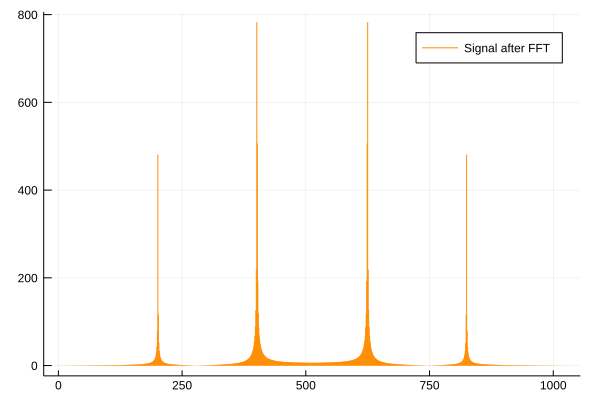

In [51]:
using FFTW
#Dokonuję transformaty Fouriera
y = fft(x)

# wykres słupkowy transformaty (moduł z liczb zespolonych).
# symetryczny
# widoczna wysoka amplituda dla częstotliwości sygnału (tutaj 200) oraz symetrycznego odbicia tej 
# częstotliwości

sticks((abs.(fft(x))), label = "Signal after FFT", color = "dark orange")

<b> ZAD 2 </b>
2.  Usuwanie szumów:

    1. Wypełniamy tablicę wartościami funkcji cosinus ("sygnału") zaburzonej niewielkim "szumem" np. dodając do każdej wartości wylosowaną liczbę funkcją rand().
    2. Prosze narysować wykres zaszumionej funkcji.
    3. Narysować wykres transformaty Fouriera (widmo)  tego sygnału (jak poprzednio).
    4. Po transformacie wyzerowac w widmie wszystkie elementy, których wartość bezwzględna jest mniejsza niz 50. W ten sposób usuwamy "szumy" z sygnału.
    5. Przeprowadzić odwrotną transformatę funkcją ifft(). Narysować wykres otrzymanej funkcji dla <b> częsci  rzeczywistej</b>. Porównać z wejściowym wykresem sygnału.
<p>

In [52]:
f(x) = cos(pi*x) + rand()%2

f (generic function with 1 method)

In [53]:
X = Float64[]
Y = Float64[]
for i in -5:4
    push!(Y, f(i))
    push!(X, i*pi)
end

In [54]:
using DataFrames

data = DataFrame()
data[:X] = X
data[:Y] = Y

data

,X,Y
,Float64,Float64
1,-15.708,-0.558441
2,-12.5664,1.3192
3,-9.42478,-0.986791
4,-6.28319,1.47312
5,-3.14159,-0.409735
6,0.0,1.89684
7,3.14159,-0.683774
8,6.28319,1.04463
9,9.42478,-0.411398


In [55]:
using Plots

plot(X, Y, title = "Cosinus z szumami", label = "cos(x) + r", color = "red")

data: [
  "scatter with fields color, label, title, type, x, and y"
]

layout: "layout with field margin"

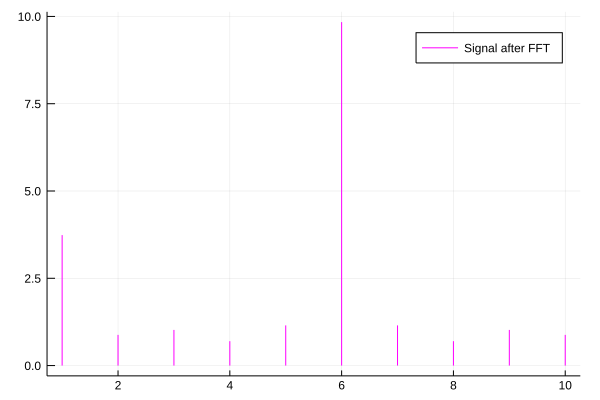

In [56]:
using FFTW
#Dokonuję transformaty Fouriera
w = fft(Y)

# wykres słupkowy transformaty (moduł z liczb zespolonych).
# symetryczny
# widoczna wysoka amplituda dla częstotliwości sygnału (tutaj 200) oraz symetrycznego odbicia tej 
# częstotliwości

sticks((abs.(fft(Y))), label = "Signal after FFT", color = "magenta")

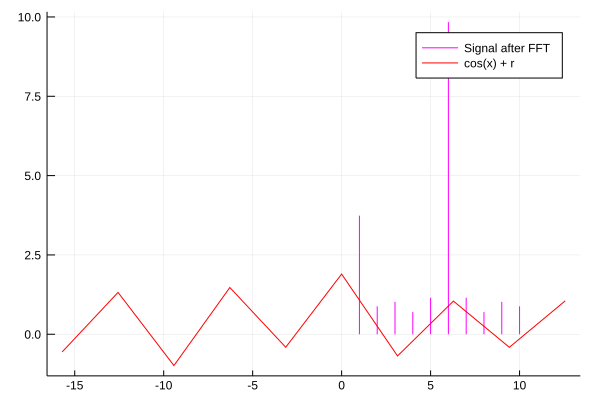

In [57]:
# Signał po FFT na tle oryginalnej funkcji

plot!(X, Y, label = "cos(x) + r", color = "red")

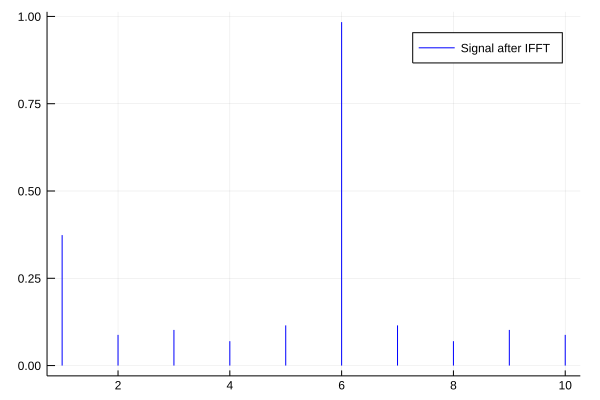

In [58]:
using FFTW

#Dokonuję odwrotnej transformaty Fouriera
v = ifft(Y)

p = sticks((abs.(ifft(Y))), label = "Signal after IFFT", color = "blue")

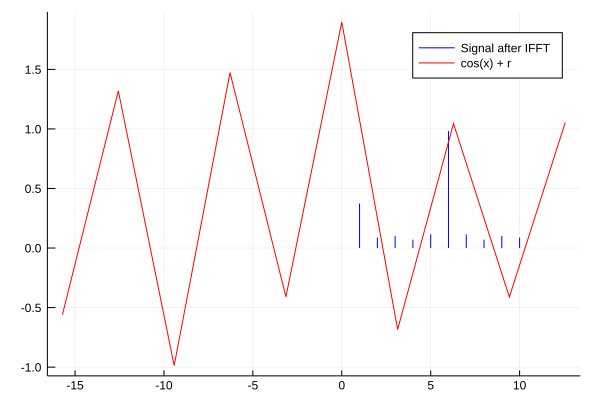

In [59]:
# Signał po IFFT na tle oryginalnej funkcji

plot!(X, Y, label = "cos(x) + r", color = "red")

3. Proszę nagrać własny glos i zastosować na nim trasformatę Fouriera, narysować wykres widma. Następnie poeksperymentować (wyciąć wybrane częstotliwości), dokonać odwrotnej transformaty i odsłuchać efekt.
<p>
Przydatne materiały:
     1. <a href="http://samcarcagno.altervista.org/blog/basic-sound-processing-julia/"> Basic sound processing</a>
     2. <a href="https://github.com/dancasimiro/WAV.jl"> Pakiet Wav </a>

In [1]:
Pkg.add("WAV")
Pkg.add("PlotlyJS")

 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [60]:
using WAV, PlotlyJS
sound, sampFreq, nbits = wavread("FFT/FFT.wav")

([0.0 0.0; 0.0 0.0; … ; -6.1037e-5 9.15555e-5; -3.05185e-5 9.15555e-5], 48000.0f0, 0x0010, WAVChunk[WAVChunk(Symbol("fmt "), UInt8[0x10, 0x00, 0x00, 0x00, 0x01, 0x00, 0x02, 0x00, 0x80, 0xbb, 0x00, 0x00, 0x00, 0xee, 0x02, 0x00, 0x04, 0x00, 0x10, 0x00]), WAVChunk(:LIST, UInt8[0x49, 0x4e, 0x46, 0x4f, 0x49, 0x43, 0x52, 0x44, 0x05, 0x00  …  0x35, 0x38, 0x2e, 0x31, 0x32, 0x2e, 0x31, 0x30, 0x30, 0x00])])

In [61]:
s = size(sound)

(140288, 2)

In [62]:
# kanal 1
channel1 = sound[:,1]

140288-element Array{Float64,1}:
  0.0                   
  0.0                   
  0.0                   
  0.0                   
  0.0                   
  0.0                   
  0.0                   
  0.0                   
  0.0                   
 -3.051850947599719e-5  
  0.0                   
 -3.051850947599719e-5  
 -3.051850947599719e-5  
  ⋮                     
  0.0                   
 -3.051850947599719e-5  
  3.051850947599719e-5  
 -3.051850947599719e-5  
 -6.103701895199438e-5  
 -3.051850947599719e-5  
 -6.103701895199438e-5  
 -0.00018311105685598315
  3.051850947599719e-5  
 -0.00015259254737998596
 -6.103701895199438e-5  
 -3.051850947599719e-5  

In [63]:
timeArray = (0:(s[1]-1)) / sampFreq
timeArray = timeArray * 1000 #scale to milliseconds

0.0f0:0.020833334f0:2922.6458f0

In [64]:
P = plot(scatter(;x=timeArray, y=channel1),
     Layout(xaxis_title="Time (ms)",
            xaxis_zeroline=false,
            xaxis_showline=true,
            xaxis_mirror=true,
            yaxis_title="Amplitude",
            yaxis_zeroline=false,
            yaxis_showline=true,
            yaxis_mirror=true))

data: [
  "scatter with fields type, x, and y"
]

layout: "layout with fields margin, xaxis, and yaxis"

In [65]:
wavwrite(channel1, "FFT/channel1.wav"; Fs=sampFreq, nbits=nbits, compression=WAVE_FORMAT_PCM)

In [66]:
n1 = length(channel1)
p1 = fft(channel1)

140288-element Array{Complex{Float64},1}:
  -7.972808008056868 + 4.692427002517263e-15im
  3.3310069394467816 + 3.5529481461302033im   
 -28.267835929353453 + 58.14386474658508im    
  13.599472889150096 - 35.90124928517846im    
  13.234169325594388 - 18.04803915303283im    
   86.96294494177334 - 55.38295211242274im    
 -17.059161539907283 + 62.65169733168827im    
  -84.65822413523213 - 146.41554160883936im   
   61.54867169048771 + 0.9020451316402149im   
  24.661618883584588 - 14.392643187909663im   
  -46.77063282620189 - 21.369016198002306im   
  131.81395558775094 + 12.65400749396138im    
  -81.22550684221991 - 29.606903953840188im   
                     ⋮                        
  -81.22550684221994 + 29.60690395384018im    
    131.813955587751 - 12.654007493961359im   
  -46.77063282620191 + 21.36901619800231im    
  24.661618883584627 + 14.39264318790965im    
  61.548671690487694 - 0.9020451316402264im   
  -84.65822413523217 + 146.41554160883942im   
 -17.0591615399072

In [ ]:
sticks((abs.(p1)), label = "Signal after FFT", color = "green")

In [ ]:
function change_freq(signal, freq, filename)
    s = size(signal)
    k = s[1]
    tab = Complex{Float64}[]
    for i in 1:k
        push!(tab, freq*signal[i])
    end
    f = real(ifft(tab))
    wavwrite(f, filename; Fs = sampFreq, nbits = nbits, compression = WAVE_FORMAT_PCM)
    return k
end

In [ ]:
f1 = change_freq(p1, 2, "FFT/channel1_2.wav")
f2 = change_freq(p1, 1.5, "FFT/channel1_1,5.wav")
f3 = change_freq(p1, 0.5, "FFT/channel1_0,5.wav")